<a href="https://colab.research.google.com/github/Wishmi-Sasika/DermascopeAI/blob/Eczema/backend/Notebooks/Eczema_Detection_MobileNetV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount ('/content/drive')

Mounted at /content/drive


Dataset Exploration

Total number of images: 1193
Class distribution (normal: eczema): [604 589]
Image sizes (height x width): Min: [ 98 129], Max: [2402 2688], Mean: [517.45012573 580.61609388]


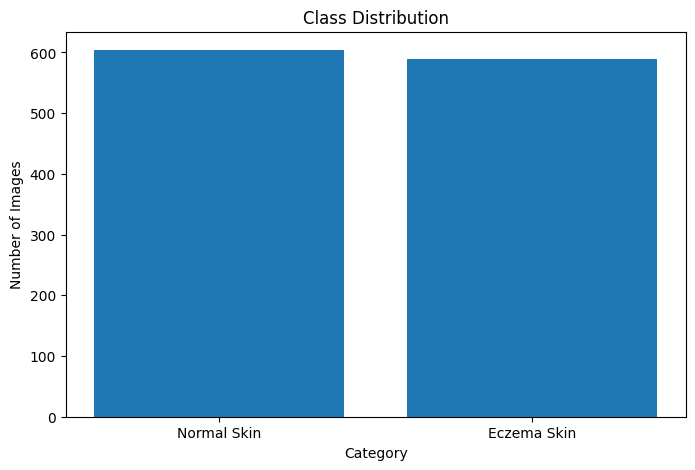

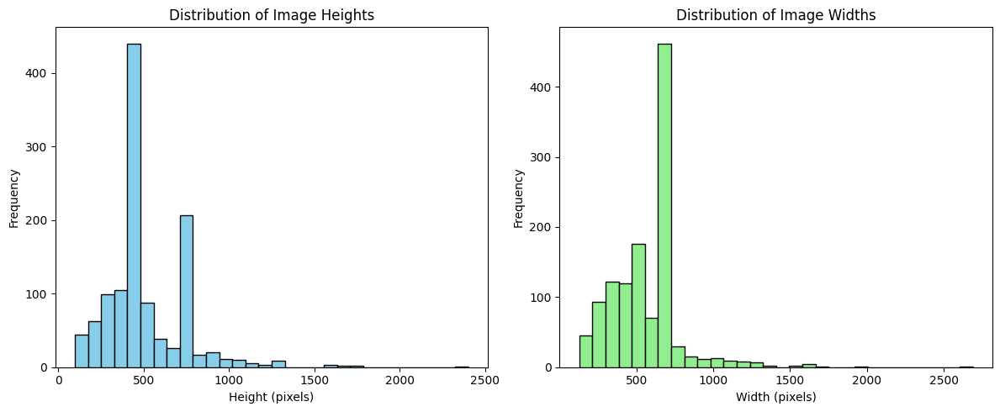

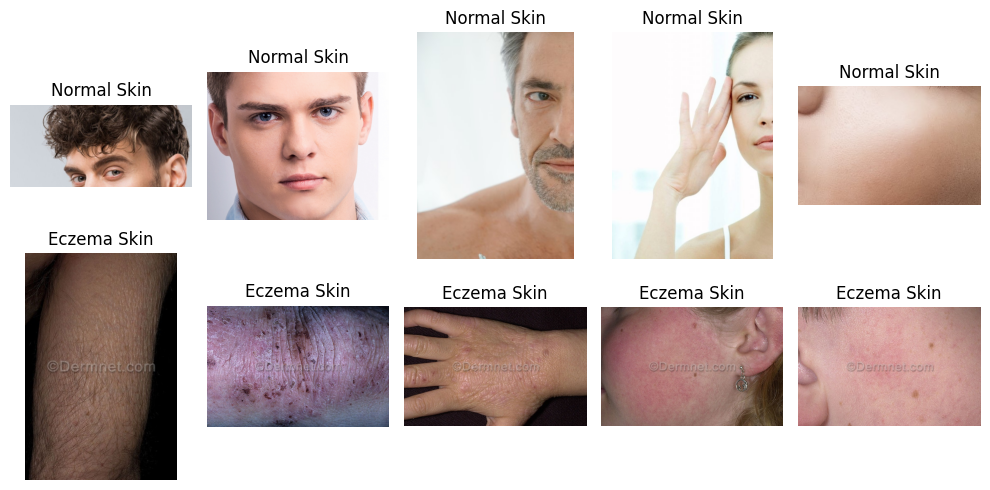

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

data_dir = '/content/drive/MyDrive/Research Project/Data/Eczema/Detection/'
categories = ['Normal Skin', 'Eczema Skin']

# Function to get dataset statistics and visualize some images
def explore_dataset(data_dir, categories):
    image_paths = []
    labels = []
    image_sizes = []

    # Loop through each category (normal and eczema)
    for category in categories:
        category_path = os.path.join(data_dir, category)
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            image_paths.append(img_path)
            labels.append(category)

            # Get image size
            img = cv2.imread(img_path)
            height, width, _ = img.shape
            image_sizes.append((height, width))

    # Convert labels to numerical (normal: 0, eczema: 1)
    labels = np.array([0 if label == 'Normal Skin' else 1 for label in labels])

    # Print dataset statistics
    print(f"Total number of images: {len(image_paths)}")
    print(f"Class distribution (normal: eczema): {np.bincount(labels)}")

    # Image size stats (height and width)
    image_sizes = np.array(image_sizes)
    print(f"Image sizes (height x width): Min: {image_sizes.min(axis=0)}, Max: {image_sizes.max(axis=0)}, Mean: {image_sizes.mean(axis=0)}")

    # Visualization 1: Class distribution bar chart
    plt.figure(figsize=(8, 5))
    plt.bar(['Normal Skin', 'Eczema Skin'], np.bincount(labels))
    plt.title('Class Distribution')
    plt.xlabel('Category')
    plt.ylabel('Number of Images')
    plt.show()

    # Visualization 2: Image size distribution (Height and Width histograms)
    plt.figure(figsize=(12, 5))

    # Histogram of image heights
    plt.subplot(1, 2, 1)
    plt.hist(image_sizes[:, 0], bins=30, color='skyblue', edgecolor='black')
    plt.title('Distribution of Image Heights')
    plt.xlabel('Height (pixels)')
    plt.ylabel('Frequency')

    # Histogram of image widths
    plt.subplot(1, 2, 2)
    plt.hist(image_sizes[:, 1], bins=30, color='lightgreen', edgecolor='black')
    plt.title('Distribution of Image Widths')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    # Visualization 3: Sample images from each category
    plt.figure(figsize=(10, 5))

    # Show 5 random images from each category
    for i, category in enumerate(categories):
        category_path = os.path.join(data_dir, category)
        img_files = os.listdir(category_path)
        random_imgs = np.random.choice(img_files, 5)

        for j, img_file in enumerate(random_imgs):
            img_path = os.path.join(category_path, img_file)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for displaying
            ax = plt.subplot(2, 5, i*5 + j + 1)
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f"{category}")

    plt.tight_layout()
    plt.show()

# Call the function to explore the dataset
explore_dataset(data_dir, categories)

Image Preprocessing

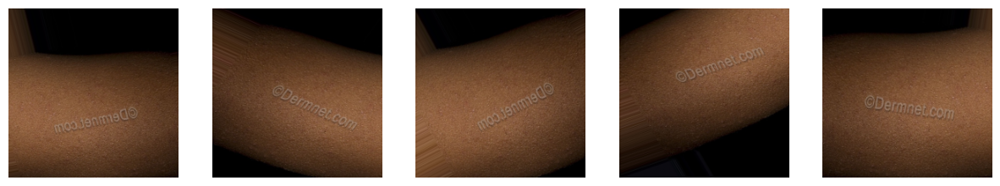

Batch shape: (32, 224, 224, 3) Labels shape: (32,)


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

img_size = 224  # Desired image size (224x224 or 256x256)
batch_size = 32  # For training batch size
seed = 42  # Random seed for reproducibility

# Function to load images and their corresponding labels (normal or eczema)
def load_data(data_dir):
    images = []
    labels = []
    for category in categories:  # Assuming folders are named 'normal' and 'eczema'
        category_path = os.path.join(data_dir, category)
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
            img = cv2.resize(img, (img_size, img_size))  # Resize image to uniform size
            images.append(img)
            labels.append(0 if category == 'normal' else 1)  # 0 = normal, 1 = eczema
    return np.array(images), np.array(labels)

# Load the dataset
images, labels = load_data(data_dir)

# Normalize pixel values to the range [0, 1]
images = images / 255.0

# Split dataset into training and validation sets (70% train, 30% validation)
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=seed)

# Data Augmentation to improve generalization
datagen = ImageDataGenerator(
    rotation_range=30,          # Random rotation of images
    width_shift_range=0.2,      # Horizontal shift
    height_shift_range=0.2,     # Vertical shift
    shear_range=0.2,            # Shearing
    zoom_range=0.2,             # Zoom in and out
    horizontal_flip=True,       # Flip images horizontally
    fill_mode='nearest'         # Fill missing pixels after transformation
)

# Fit data augmentation on training data (it will be applied during training)
datagen.fit(X_train)

# Check some augmented images to ensure it's working
def plot_augmented_images(datagen, X_sample):
    fig, axes = plt.subplots(1, 5, figsize=(15, 15))
    for i, ax in enumerate(axes):
        augmented_image = datagen.random_transform(X_sample)
        ax.imshow(augmented_image)
        ax.axis('off')
    plt.show()

# Take a random sample from the training set
sample_image = X_train[np.random.randint(0, len(X_train))]

# Visualize some augmented images
plot_augmented_images(datagen, sample_image)

# Convert to TensorFlow Dataset format for efficient batching during training
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_dataset = train_dataset.shuffle(buffer_size=1024).batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
val_dataset = val_dataset.batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)

# You can now use train_dataset and val_dataset for training your model

# Example code for a quick test on the first batch
for images_batch, labels_batch in train_dataset.take(1):
    print("Batch shape:", images_batch.shape, "Labels shape:", labels_batch.shape)

With attention mechanism

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,304,162 (8.79 MB)

 Trainable params: 43,618 (170.38 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


30/30 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.4768 - loss: 4.3548 - val_accuracy: 0.5021 - val_loss: 3.9286 - learning_rate: 1.0000e-05
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.5281 - loss: 4.1768 - val_accuracy: 0.5021 - val_loss: 3.8577 - learning_rate: 1.0000e-05
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.5251 - loss: 4.1108 - val_accuracy: 0.4979 - val_loss: 3.8098 - learning_rate: 1.0000e-05
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step - accuracy: 0.5236 - loss: 4.0474 - val_accuracy: 0.5272 - val_loss: 3.7704 - learning_rate: 1.0000e-05
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.5255 - loss: 4.0455 - val_accuracy: 0.5314 - val_loss: 3.7374 - learning_rate: 1.0000e-05
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.5635 - loss: 4.0463 - val_accuracy: 0.5607 - val_loss: 3.7042 - learning_rate: 1.0000e-05
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.5216 - loss: 3.9975 - v

Validation Accuracy: 0.8033, Validation Loss: 3.1148
Eczema detection model saved.


8/8 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.82      0.82       128
           1       0.79      0.78      0.79       111

    accuracy                           0.80       239
   macro avg       0.80      0.80      0.80       239
weighted avg       0.80      0.80      0.80       239



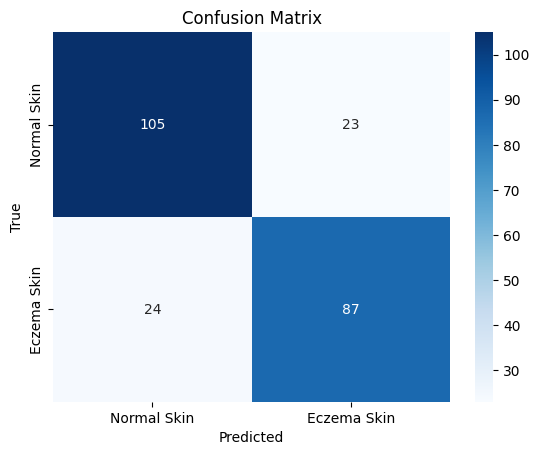

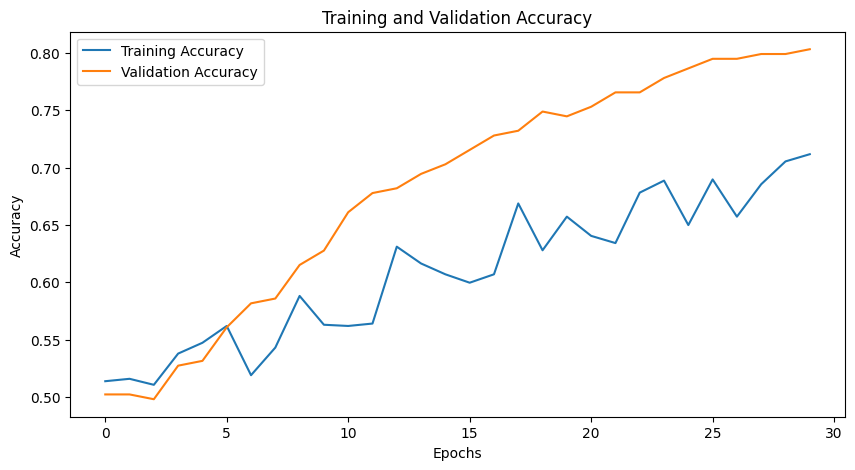

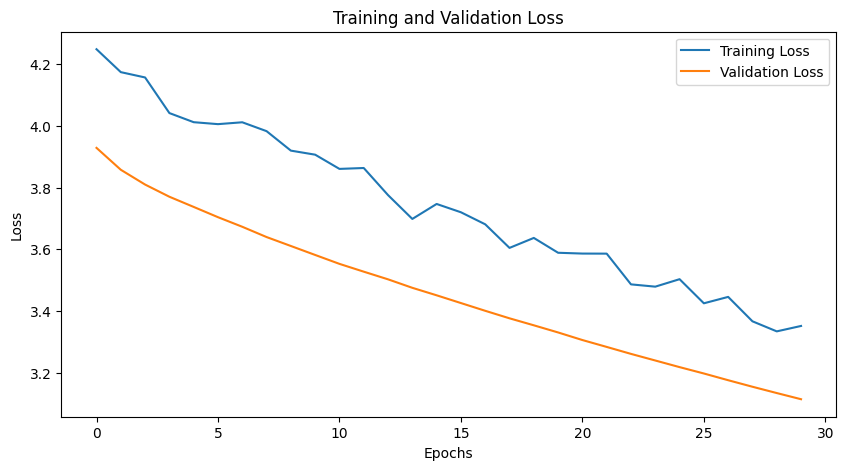

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Set parameters
img_size = 224
batch_size = 32
seed = 42

# Data directory and categories
data_dir = '/content/drive/MyDrive/Research Project/Data/Eczema/Detection/'
categories = ['Normal Skin', 'Eczema Skin']

# Function to load images and labels
def load_data(data_dir):
    images, labels = [], []
    for category in categories:
        category_path = os.path.join(data_dir, category)
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (img_size, img_size))
            images.append(img)
            labels.append(0 if category == 'Normal Skin' else 1)
    return np.array(images), np.array(labels)

# Load and preprocess dataset
images, labels = load_data(data_dir)
images = images / 255.0

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=seed)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(zip(np.unique(y_train), class_weights))

# Enhanced data augmentation
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(X_train)

# Build MobileNetV2 model with adjustments
def build_model(input_shape=(224, 224, 3), num_classes=2):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freeze the base model

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)  # Add dropout after pooling
    x = layers.BatchNormalization()(x)
    x = layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.05))(x)
    x = layers.Dropout(0.5)(x)  # Moderate dropout rate
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=base_model.input, outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model

# Build the model
model = build_model()
model.summary()

# Callbacks for training
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, min_lr=1e-7)
checkpoint = ModelCheckpoint('eczema_model_best.keras', monitor='val_loss', save_best_only=True, mode='min')

# Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    epochs=30,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr, checkpoint]
)

# Evaluate the model
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {val_accuracy:.4f}, Validation Loss: {val_loss:.4f}")

# Save the final model
model.save('Eczema_Detection_Model_Improved.h5')
print("Eczema detection model saved.")

# Classification report and confusion matrix
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
print("Classification Report:")
print(classification_report(y_val, y_pred_classes))

cm = confusion_matrix(y_val, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training & validation accuracy and loss
def plot_history(history):
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

30 epochs

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,304,162 (8.79 MB)

 Trainable params: 43,618 (170.38 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


30/30 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.5064 - loss: 4.2884 - val_accuracy: 0.6402 - val_loss: 3.7681 - learning_rate: 1.0000e-05
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.5431 - loss: 4.1741 - val_accuracy: 0.6527 - val_loss: 3.7376 - learning_rate: 1.0000e-05
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.5542 - loss: 4.2183 - val_accuracy: 0.6820 - val_loss: 3.7118 - learning_rate: 1.0000e-05
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.5708 - loss: 4.1260 - val_accuracy: 0.6862 - val_loss: 3.6881 - learning_rate: 1.0000e-05
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.5510 - loss: 4.1319 - val_accuracy: 0.6946 - val_loss: 3.6639 - learning_rate: 1.0000e-05
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 78s 2s/step - accuracy: 0.5422 - loss: 4.2034 - val_accuracy: 0.7071 - val_loss: 3.6367 - learning_rate: 1.0000e-05
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.5646 - loss: 4.0831 - v

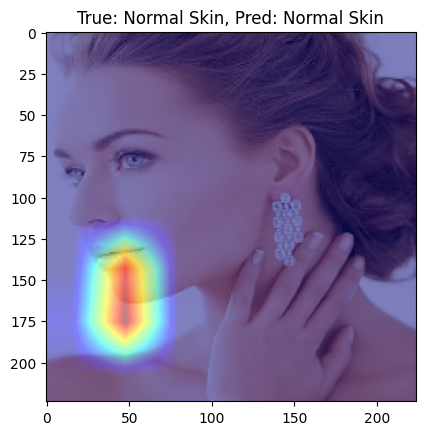

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


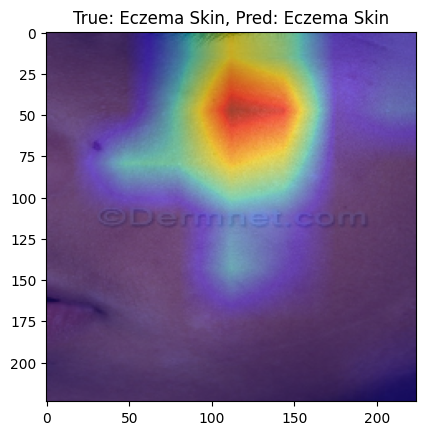

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


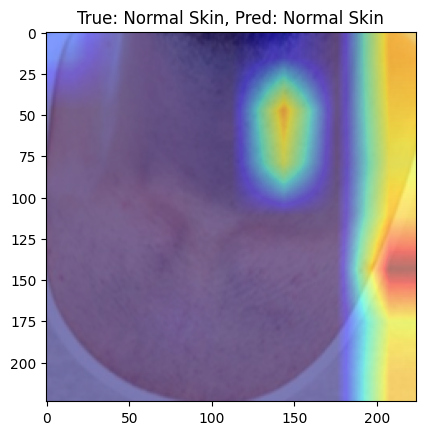

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


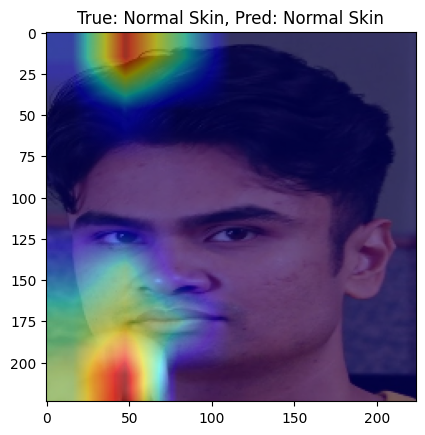

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


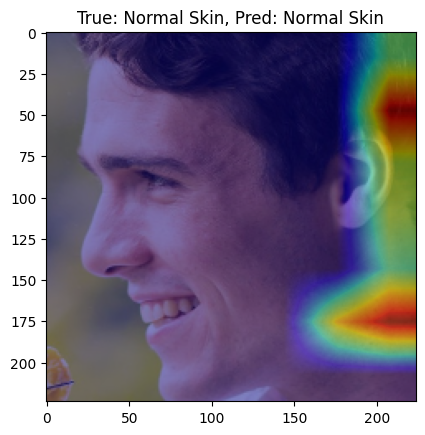

Eczema detection model saved.
8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.90      0.89       128
           1       0.88      0.86      0.87       111

    accuracy                           0.88       239
   macro avg       0.88      0.88      0.88       239
weighted avg       0.88      0.88      0.88       239



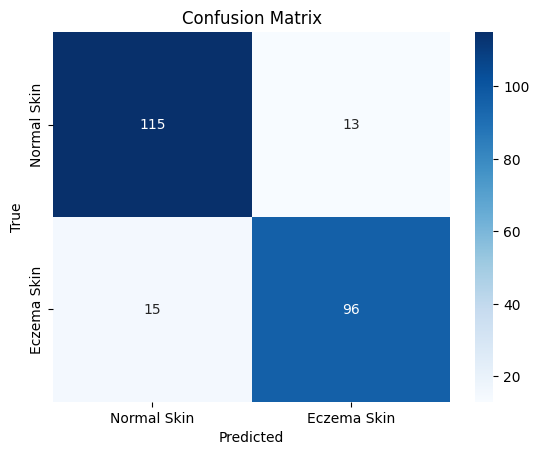

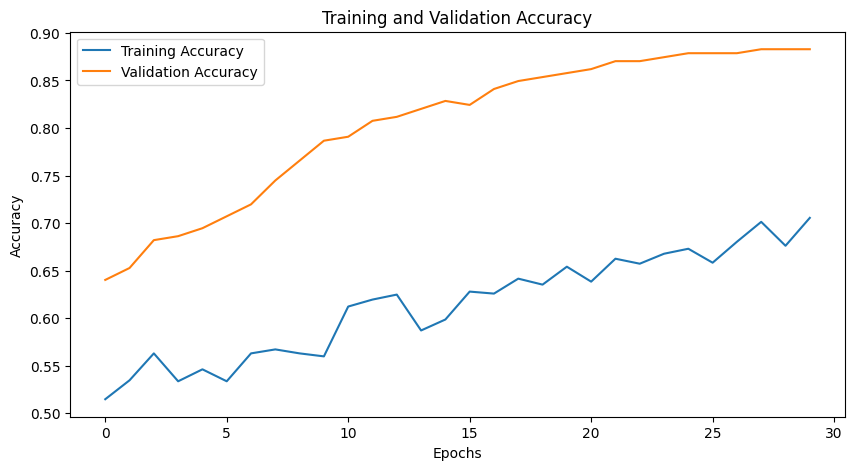

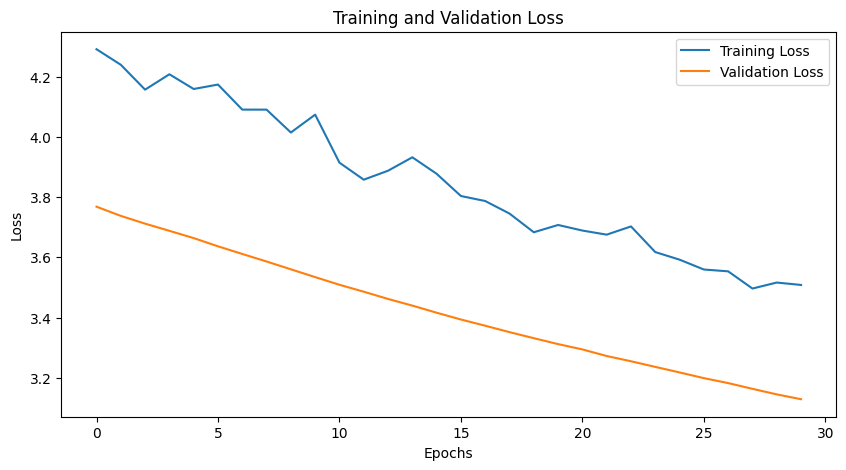

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Set parameters
img_size = 224
batch_size = 32
seed = 42

# Data directory and categories
data_dir = '/content/drive/MyDrive/Research Project/Data/Eczema/Detection/'
categories = ['Normal Skin', 'Eczema Skin']

# Function to load images and labels
def load_data(data_dir):
    images, labels = [], []
    for category in categories:
        category_path = os.path.join(data_dir, category)
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (img_size, img_size))
            images.append(img)
            labels.append(0 if category == 'Normal Skin' else 1)
    return np.array(images), np.array(labels)

# Load and preprocess dataset
images, labels = load_data(data_dir)
images = images / 255.0

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=seed)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(zip(np.unique(y_train), class_weights))

# Enhanced data augmentation
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(X_train)

# Build MobileNetV2 model with adjustments
def build_model(input_shape=(224, 224, 3), num_classes=2):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freeze the base model

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)  # Add dropout after pooling
    x = layers.BatchNormalization()(x)
    x = layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.05))(x)
    x = layers.Dropout(0.5)(x)  # Moderate dropout rate
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=base_model.input, outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model

# Build the model
model = build_model()
model.summary()

# Callbacks for training
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, min_lr=1e-7)
checkpoint = ModelCheckpoint('eczema_model_best.keras', monitor='val_loss', save_best_only=True, mode='min')

# Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    epochs=30,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr, checkpoint]
)

# Evaluate the model
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {val_accuracy:.4f}, Validation Loss: {val_loss:.4f}")

# Grad-CAM Visualization
def grad_cam(model, image, layer_name):
    grad_model = tf.keras.models.Model(inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        inputs = tf.cast(image[np.newaxis, ...], tf.float32)
        conv_outputs, predictions = grad_model(inputs)
        loss = predictions[:, 1]
    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.reduce_mean(grads, axis=(0, 1))
    cam = tf.reduce_sum(conv_outputs * guided_grads, axis=-1).numpy()[0]
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    cam = cv2.resize(cam, (img_size, img_size))
    return cam

# Test Grad-CAM
layer_name = 'Conv_1'
for i in range(5):
    cam = grad_cam(model, X_val[i], layer_name)
    plt.imshow(X_val[i])
    plt.imshow(cam, cmap='jet', alpha=0.5)
    plt.title(f"True: {categories[y_val[i]]}, Pred: {categories[np.argmax(model.predict(X_val[i][np.newaxis, ...]))]}")
    plt.show()

# Save the final model
model.save('Eczema_Detection_Model_Improved.h5')
print("Eczema detection model saved.")

# Classification report and confusion matrix
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
print("Classification Report:")
print(classification_report(y_val, y_pred_classes))

cm = confusion_matrix(y_val, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training & validation accuracy and loss
def plot_history(history):
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


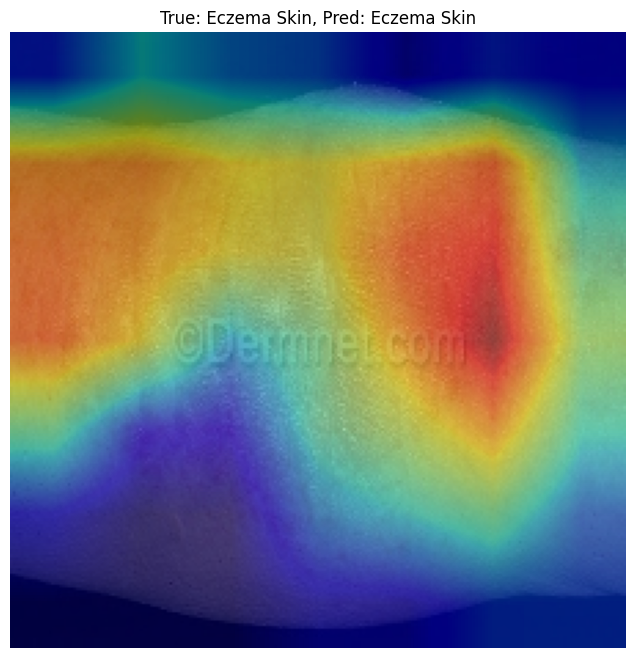

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


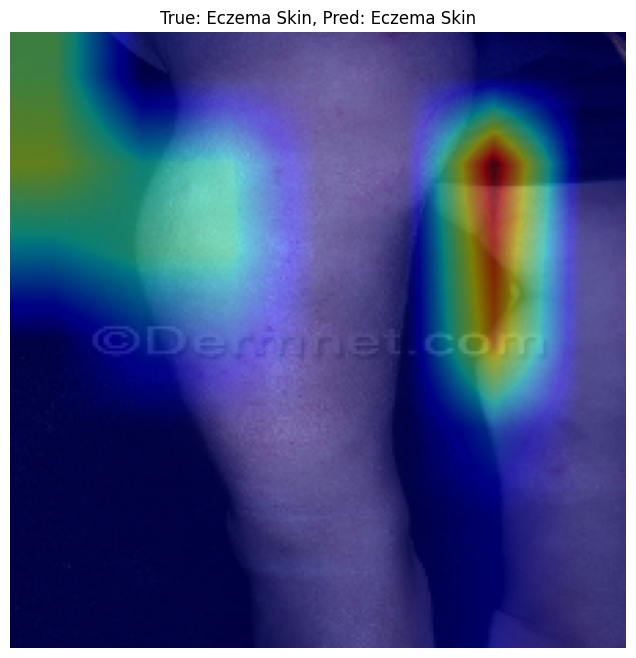

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


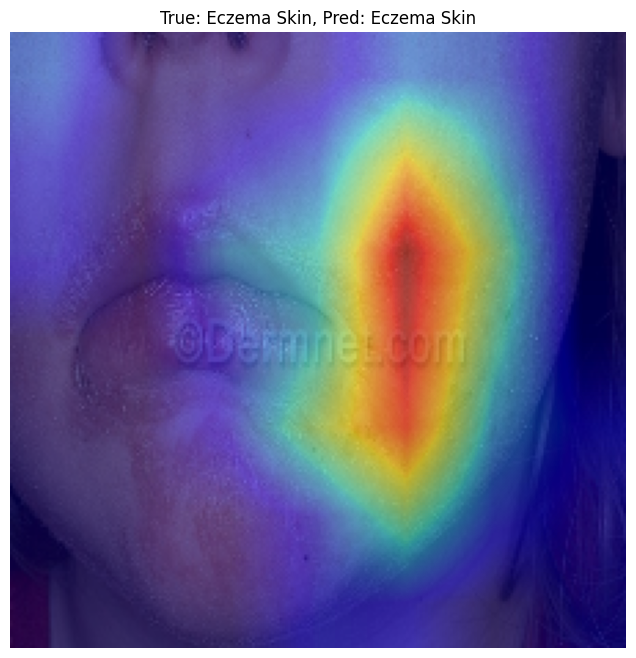

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


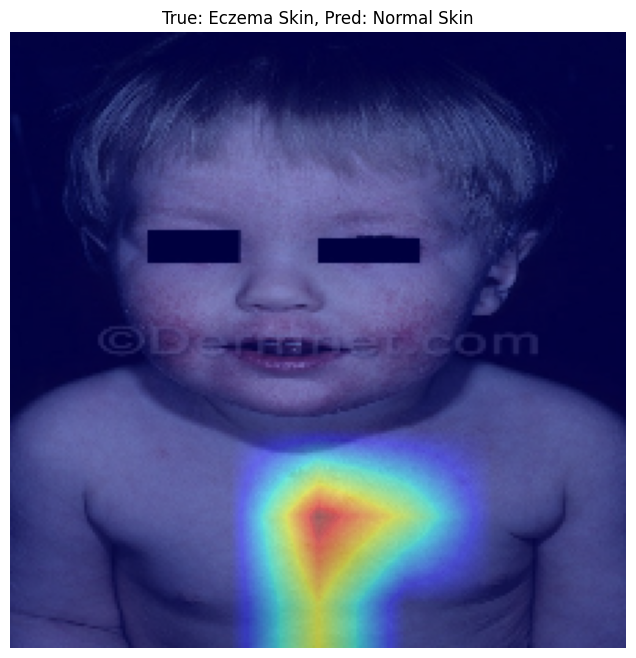

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


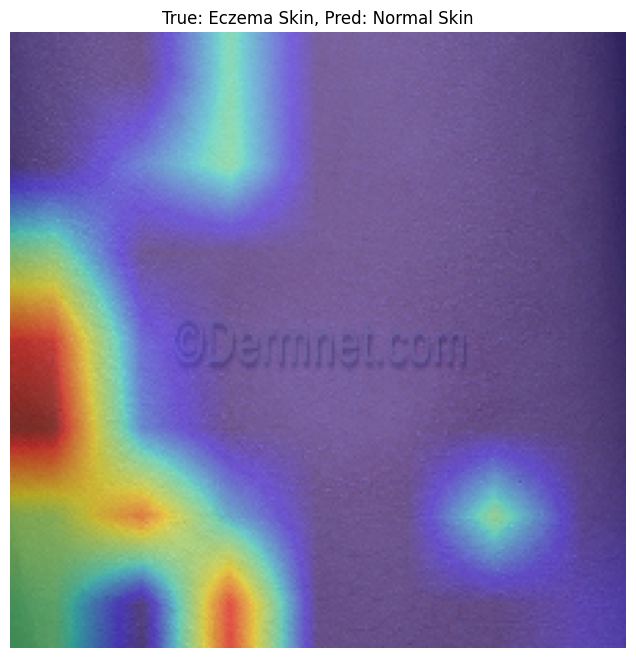

In [ ]:
# Display some eczema images with Grad-CAM visualization
def display_grad_cam_on_images(model, X_val, y_val, layer_name, categories, img_size=224, num_images=5):
    """
    Function to display Grad-CAM visualization for eczema images.
    """
    eczema_indices = np.where(y_val == 1)[0]  # Get indices of eczema images
    selected_indices = np.random.choice(eczema_indices, size=min(num_images, len(eczema_indices)), replace=False)

    for idx in selected_indices:
        image = X_val[idx]
        cam = grad_cam(model, image, layer_name)

        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.imshow(cam, cmap='jet', alpha=0.5)
        plt.title(f"True: {categories[y_val[idx]]}, Pred: {categories[np.argmax(model.predict(image[np.newaxis, ...]))]}")
        plt.axis('off')
        plt.show()

# Call the function
display_grad_cam_on_images(model, X_val, y_val, layer_name='Conv_1', categories=categories, num_images=5)

40 epochs

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├──────────────────────

 Total params: 2,304,162 (8.79 MB)

 Trainable params: 43,618 (170.38 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

Epoch 1/40


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


30/30 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - accuracy: 0.4943 - loss: 4.3265 - val_accuracy: 0.4979 - val_loss: 3.9302 - learning_rate: 1.0000e-05
Epoch 2/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 76s 2s/step - accuracy: 0.4678 - loss: 4.3708 - val_accuracy: 0.5021 - val_loss: 3.9197 - learning_rate: 1.0000e-05
Epoch 3/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.5332 - loss: 4.3041 - val_accuracy: 0.4895 - val_loss: 3.9092 - learning_rate: 1.0000e-05
Epoch 4/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.5021 - loss: 4.3098 - val_accuracy: 0.4937 - val_loss: 3.8897 - learning_rate: 1.0000e-05
Epoch 5/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - accuracy: 0.5340 - loss: 4.2429 - val_accuracy: 0.5146 - val_loss: 3.8658 - learning_rate: 1.0000e-05
Epoch 6/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - accuracy: 0.5418 - loss: 4.1586 - val_accuracy: 0.5230 - val_loss: 3.8405 - learning_rate: 1.0000e-05
Epoch 7/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.5738 - loss: 4.0929 - v

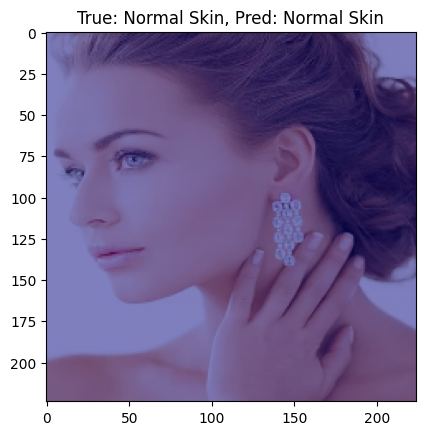

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


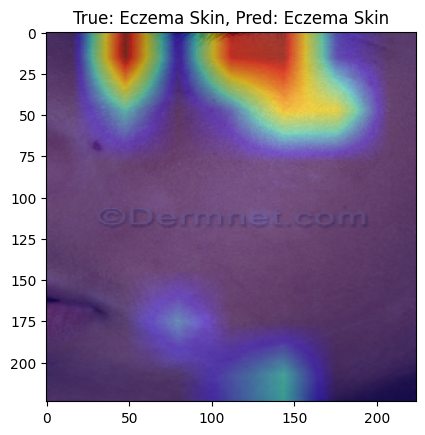

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


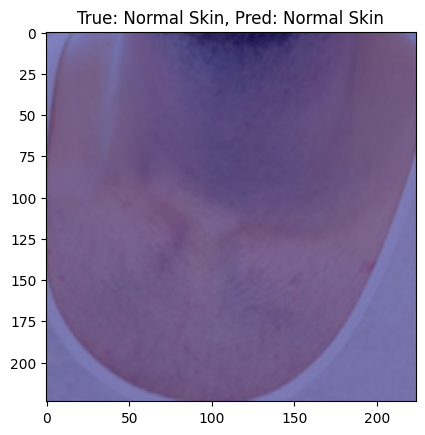

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


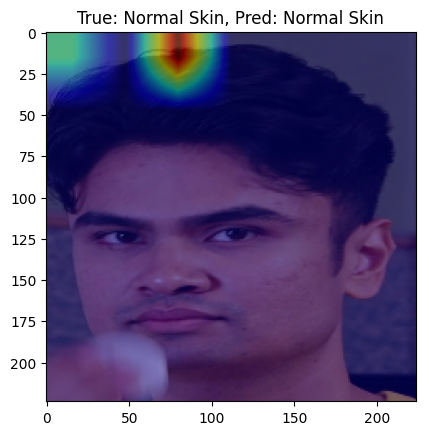

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


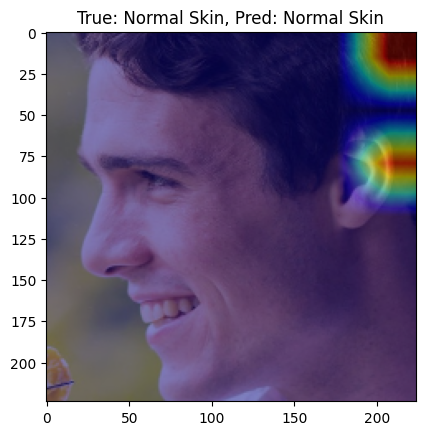

Eczema detection model saved.
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       128
           1       0.87      0.85      0.86       111

    accuracy                           0.87       239
   macro avg       0.87      0.87      0.87       239
weighted avg       0.87      0.87      0.87       239



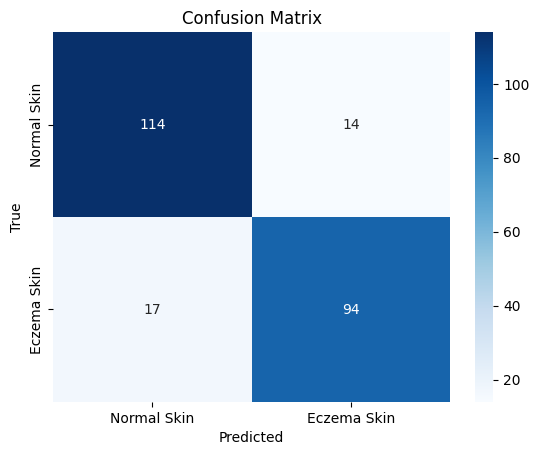

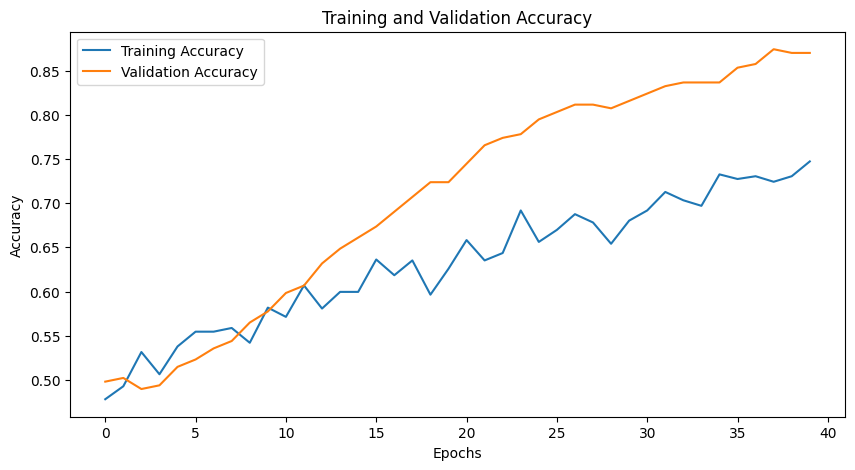

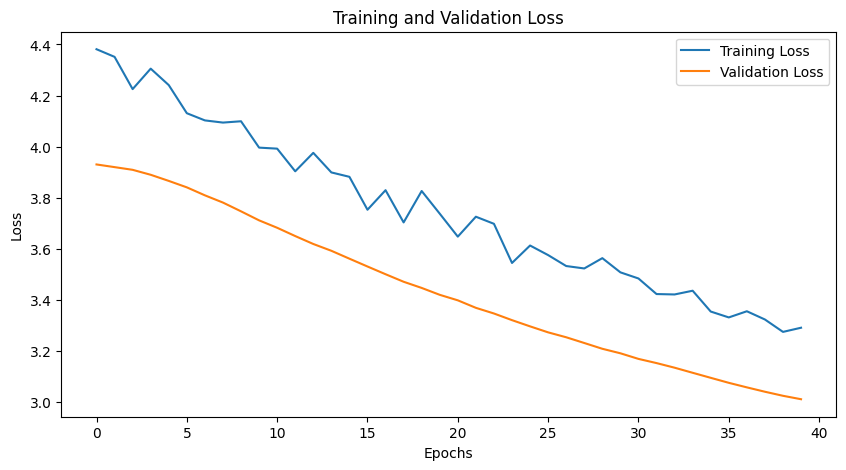

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Set parameters
img_size = 224
batch_size = 32
seed = 42

# Data directory and categories
data_dir = '/content/drive/MyDrive/Research Project/Data/Eczema/Detection/'
categories = ['Normal Skin', 'Eczema Skin']

# Function to load images and labels
def load_data(data_dir):
    images, labels = [], []
    for category in categories:
        category_path = os.path.join(data_dir, category)
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (img_size, img_size))
            images.append(img)
            labels.append(0 if category == 'Normal Skin' else 1)
    return np.array(images), np.array(labels)

# Load and preprocess dataset
images, labels = load_data(data_dir)
images = images / 255.0

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=seed)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(zip(np.unique(y_train), class_weights))

# Enhanced data augmentation
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(X_train)

# Build MobileNetV2 model with adjustments
def build_model(input_shape=(224, 224, 3), num_classes=2):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freeze the base model

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)  # Add dropout after pooling
    x = layers.BatchNormalization()(x)
    x = layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.05))(x)
    x = layers.Dropout(0.5)(x)  # Moderate dropout rate
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=base_model.input, outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model

# Build the model
model = build_model()
model.summary()

# Callbacks for training
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, min_lr=1e-7)
checkpoint = ModelCheckpoint('eczema_model_best.keras', monitor='val_loss', save_best_only=True, mode='min')

# Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    epochs=40,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr, checkpoint]
)

# Evaluate the model
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {val_accuracy:.4f}, Validation Loss: {val_loss:.4f}")

# Grad-CAM Visualization
def grad_cam(model, image, layer_name):
    grad_model = tf.keras.models.Model(inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        inputs = tf.cast(image[np.newaxis, ...], tf.float32)
        conv_outputs, predictions = grad_model(inputs)
        loss = predictions[:, 1]
    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.reduce_mean(grads, axis=(0, 1))
    cam = tf.reduce_sum(conv_outputs * guided_grads, axis=-1).numpy()[0]
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    cam = cv2.resize(cam, (img_size, img_size))
    return cam

# Test Grad-CAM
layer_name = 'Conv_1'
for i in range(5):
    cam = grad_cam(model, X_val[i], layer_name)
    plt.imshow(X_val[i])
    plt.imshow(cam, cmap='jet', alpha=0.5)
    plt.title(f"True: {categories[y_val[i]]}, Pred: {categories[np.argmax(model.predict(X_val[i][np.newaxis, ...]))]}")
    plt.show()

# Save the final model
model.save('Eczema_Detection_Model_Improved.h5')
print("Eczema detection model saved.")

# Classification report and confusion matrix
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
print("Classification Report:")
print(classification_report(y_val, y_pred_classes))

cm = confusion_matrix(y_val, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training & validation accuracy and loss
def plot_history(history):
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


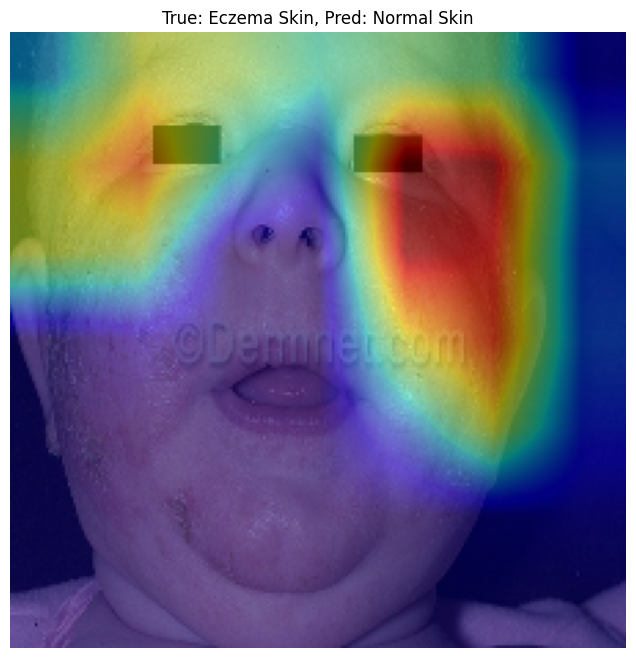

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


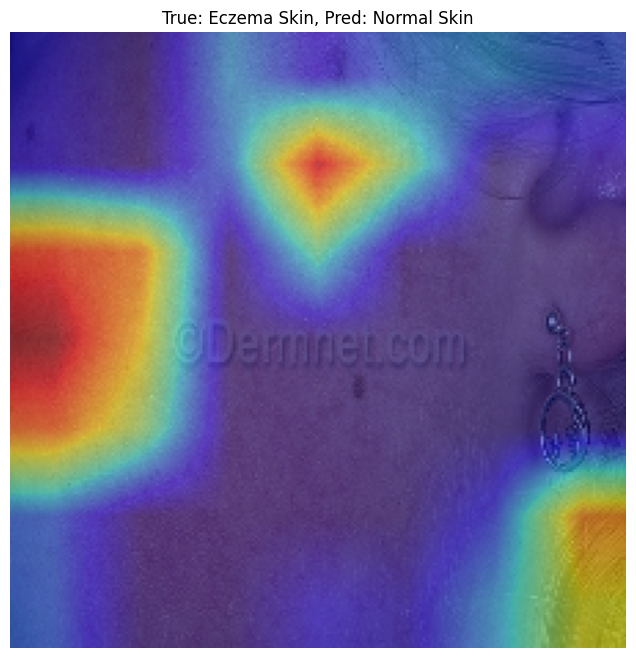

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


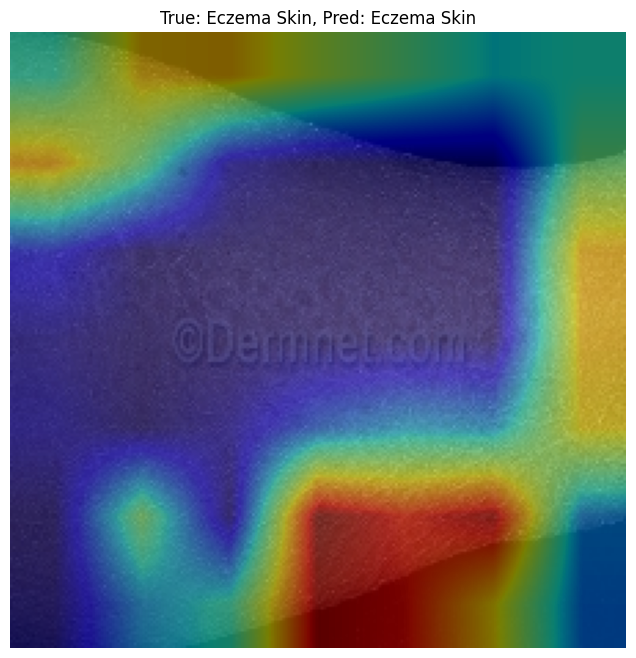

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


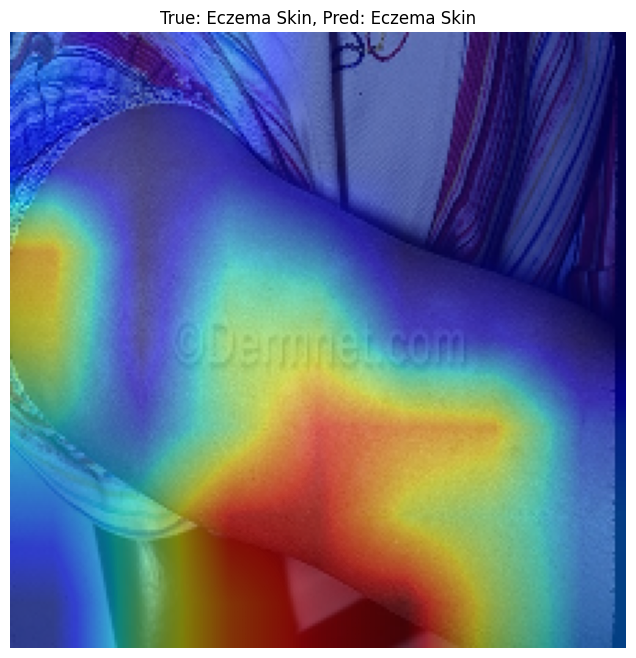

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


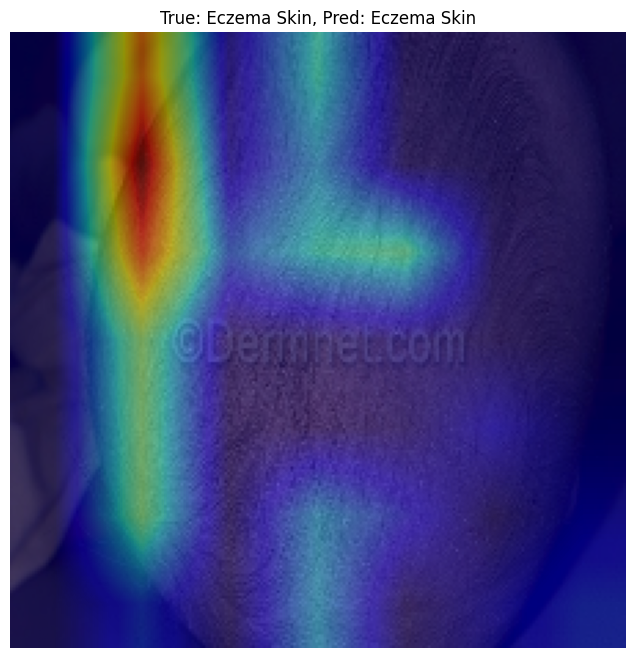

In [ ]:
# Display some eczema images with Grad-CAM visualization
def display_grad_cam_on_images(model, X_val, y_val, layer_name, categories, img_size=224, num_images=5):
    """
    Function to display Grad-CAM visualization for eczema images.
    """
    eczema_indices = np.where(y_val == 1)[0]  # Get indices of eczema images
    selected_indices = np.random.choice(eczema_indices, size=min(num_images, len(eczema_indices)), replace=False)

    for idx in selected_indices:
        image = X_val[idx]
        cam = grad_cam(model, image, layer_name)

        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.imshow(cam, cmap='jet', alpha=0.5)
        plt.title(f"True: {categories[y_val[idx]]}, Pred: {categories[np.argmax(model.predict(image[np.newaxis, ...]))]}")
        plt.axis('off')
        plt.show()

# Call the function
display_grad_cam_on_images(model, X_val, y_val, layer_name='Conv_1', categories=categories, num_images=5)

50 epochs - Final Model

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,304,162 (8.79 MB)

 Trainable params: 43,618 (170.38 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


30/30 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.5218 - loss: 4.2755 - val_accuracy: 0.5481 - val_loss: 3.9315 - learning_rate: 1.0000e-05
Epoch 2/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 363ms/step - accuracy: 0.5437 - loss: 4.3243 - val_accuracy: 0.5774 - val_loss: 3.8816 - learning_rate: 1.0000e-05
Epoch 3/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 11s 295ms/step - accuracy: 0.5556 - loss: 4.2358 - val_accuracy: 0.5774 - val_loss: 3.8420 - learning_rate: 1.0000e-05
Epoch 4/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 330ms/step - accuracy: 0.5646 - loss: 4.1703 - val_accuracy: 0.6109 - val_loss: 3.8055 - learning_rate: 1.0000e-05
Epoch 5/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 21s 355ms/step - accuracy: 0.5834 - loss: 4.1537 - val_accuracy: 0.6318 - val_loss: 3.7720 - learning_rate: 1.0000e-05
Epoch 6/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 20s 320ms/step - accuracy: 0.6126 - loss: 4.0127 - val_accuracy: 0.6402 - val_loss: 3.7397 - learning_rate: 1.0000e-05
Epoch 7/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 351ms/step - accuracy: 0.5786 

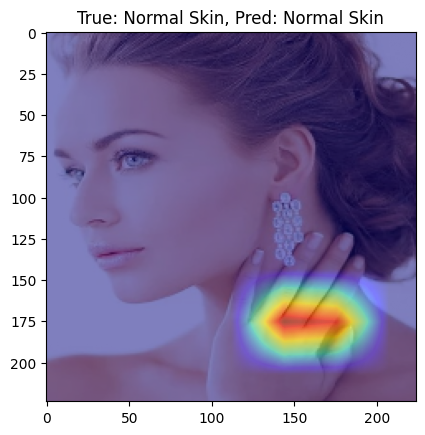

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


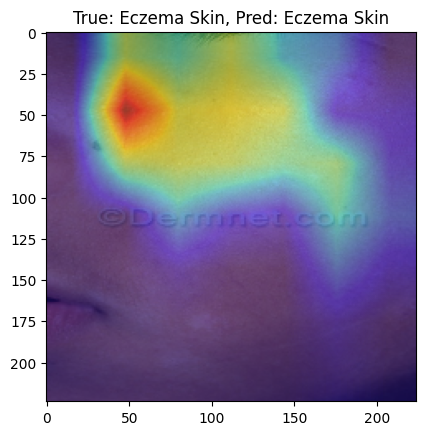

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


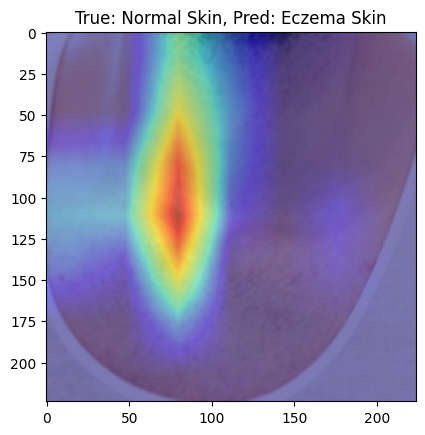

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


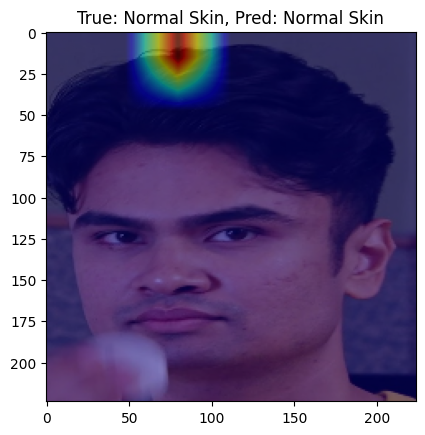

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


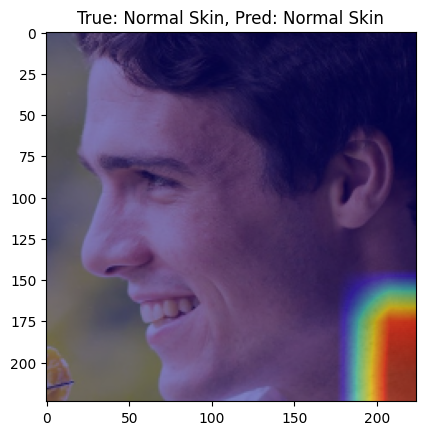

Eczema detection model saved.
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 230ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       128
           1       0.92      0.90      0.91       111

    accuracy                           0.92       239
   macro avg       0.92      0.92      0.92       239
weighted avg       0.92      0.92      0.92       239



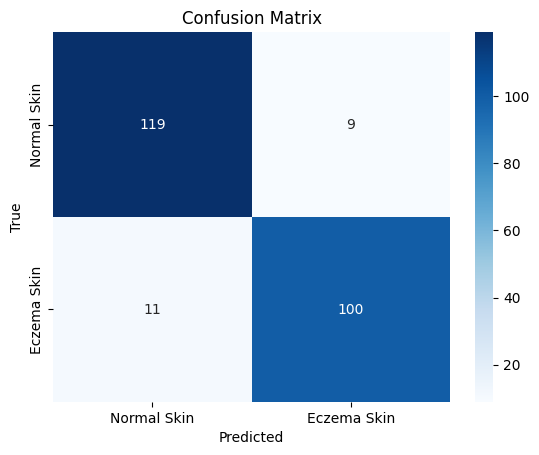

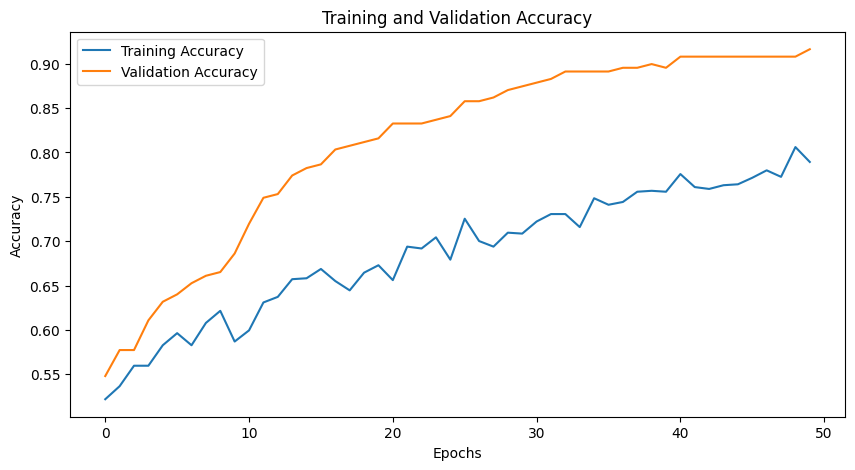

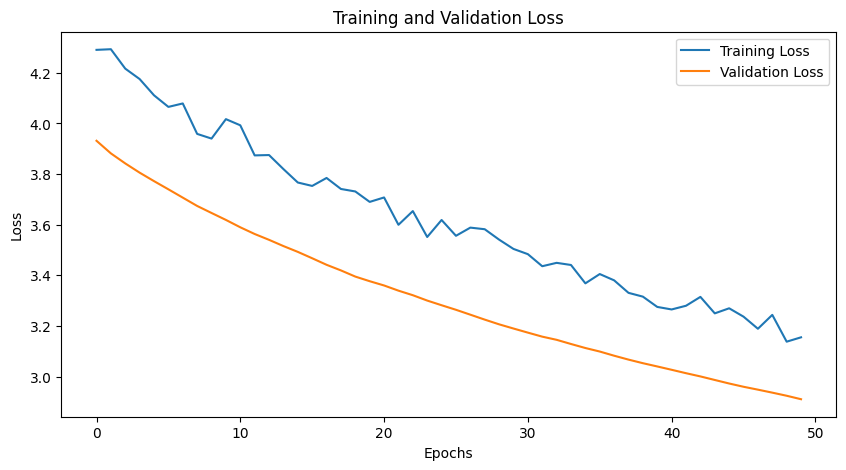

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Set parameters
img_size = 224
batch_size = 32
seed = 42

# Data directory and categories
data_dir = '/content/drive/MyDrive/Research Project/Data/Eczema/Detection/'
categories = ['Normal Skin', 'Eczema Skin']

# Function to load images and labels
def load_data(data_dir):
    images, labels = [], []
    for category in categories:
        category_path = os.path.join(data_dir, category)
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (img_size, img_size))
            images.append(img)
            labels.append(0 if category == 'Normal Skin' else 1)
    return np.array(images), np.array(labels)

# Load and preprocess dataset
images, labels = load_data(data_dir)
images = images / 255.0

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=seed)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(zip(np.unique(y_train), class_weights))

# Enhanced data augmentation
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(X_train)

# Build MobileNetV2 model with adjustments
def build_model(input_shape=(224, 224, 3), num_classes=2):
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freeze the base model

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)  # Add dropout after pooling
    x = layers.BatchNormalization()(x)
    x = layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.05))(x)
    x = layers.Dropout(0.5)(x)  # Moderate dropout rate
    output = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=base_model.input, outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    return model

# Build the model
model = build_model()
model.summary()

# Callbacks for training
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, min_lr=1e-7)
checkpoint = ModelCheckpoint('eczema_model_best.keras', monitor='val_loss', save_best_only=True, mode='min')

# Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    epochs=50,
    validation_data=(X_val, y_val),
    class_weight=class_weight_dict,
    callbacks=[early_stopping, reduce_lr, checkpoint]
)

# Evaluate the model
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Accuracy: {val_accuracy:.4f}, Validation Loss: {val_loss:.4f}")

# Grad-CAM Visualization
def grad_cam(model, image, layer_name):
    grad_model = tf.keras.models.Model(inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        inputs = tf.cast(image[np.newaxis, ...], tf.float32)
        conv_outputs, predictions = grad_model(inputs)
        loss = predictions[:, 1]
    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.reduce_mean(grads, axis=(0, 1))
    cam = tf.reduce_sum(conv_outputs * guided_grads, axis=-1).numpy()[0]
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    cam = cv2.resize(cam, (img_size, img_size))
    return cam

# Test Grad-CAM
layer_name = 'Conv_1'
for i in range(5):
    cam = grad_cam(model, X_val[i], layer_name)
    plt.imshow(X_val[i])
    plt.imshow(cam, cmap='jet', alpha=0.5)
    plt.title(f"True: {categories[y_val[i]]}, Pred: {categories[np.argmax(model.predict(X_val[i][np.newaxis, ...]))]}")
    plt.show()

# Save the final model
model.save('Eczema_Detection_Model_Improved.h5')
print("Eczema detection model saved.")

# Classification report and confusion matrix
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
print("Classification Report:")
print(classification_report(y_val, y_pred_classes))

cm = confusion_matrix(y_val, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training & validation accuracy and loss
def plot_history(history):
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


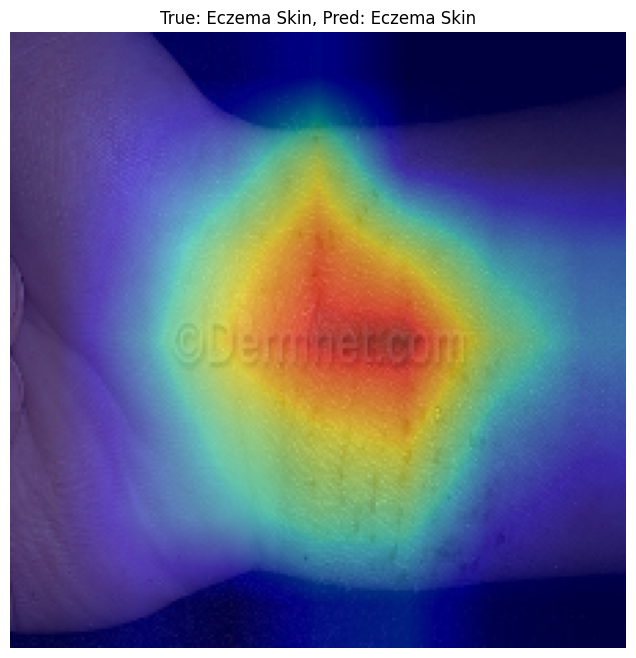

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


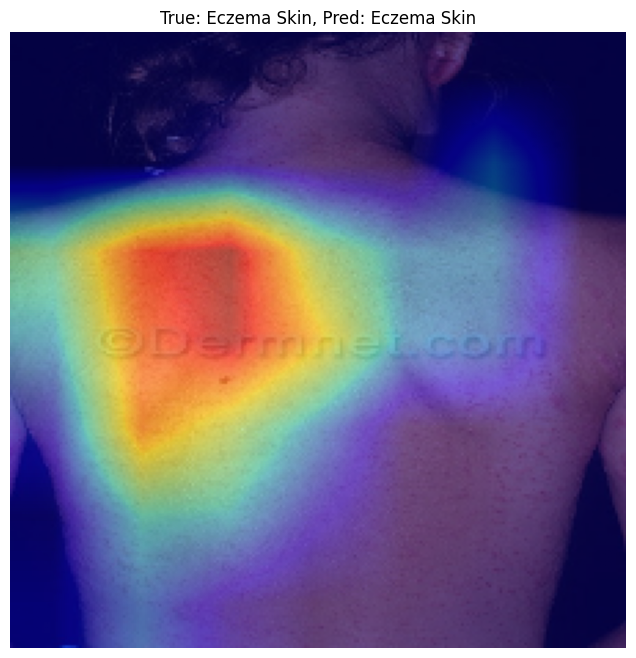

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


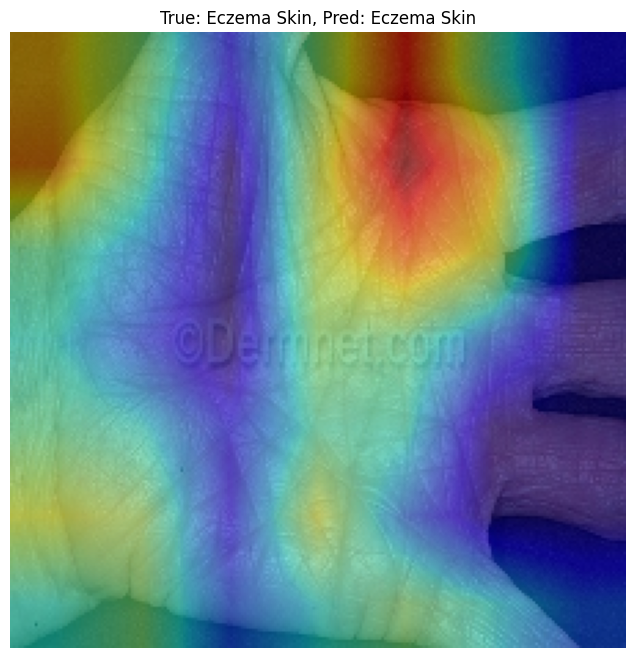

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


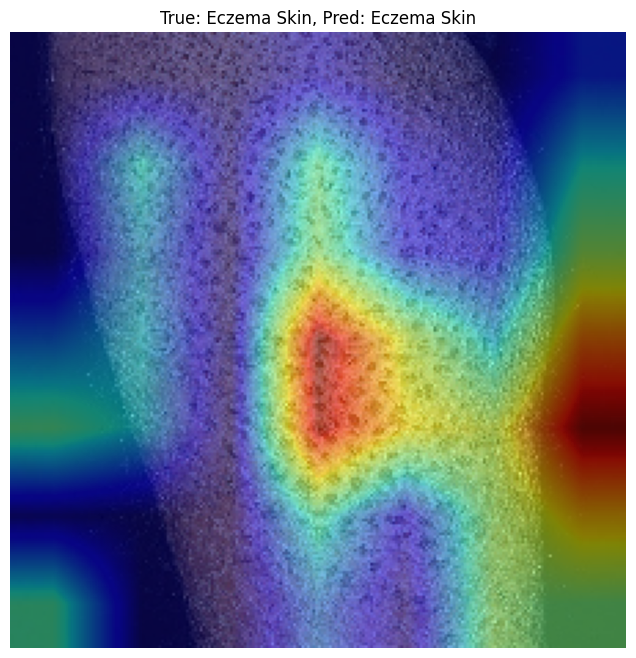

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


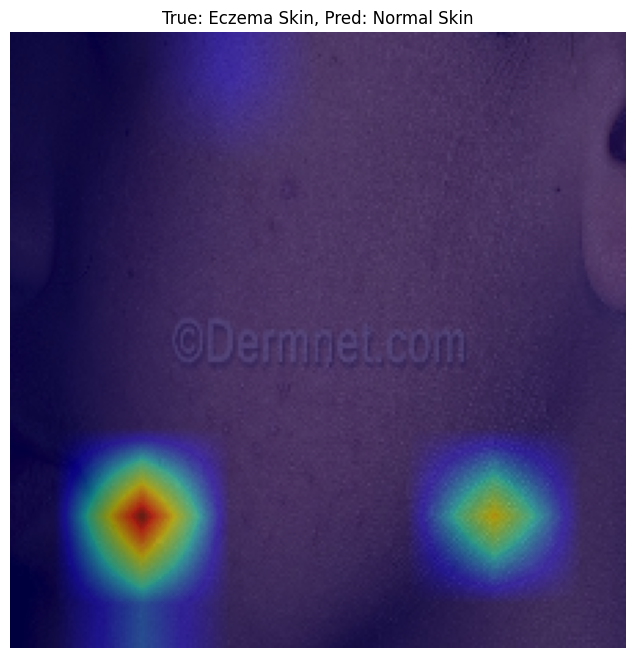

In [ ]:
# Display some eczema images with Grad-CAM visualization
def display_grad_cam_on_images(model, X_val, y_val, layer_name, categories, img_size=224, num_images=5):
    """
    Function to display Grad-CAM visualization for eczema images.
    """
    eczema_indices = np.where(y_val == 1)[0]  # Get indices of eczema images
    selected_indices = np.random.choice(eczema_indices, size=min(num_images, len(eczema_indices)), replace=False)

    for idx in selected_indices:
        image = X_val[idx]
        cam = grad_cam(model, image, layer_name)

        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.imshow(cam, cmap='jet', alpha=0.5)
        plt.title(f"True: {categories[y_val[idx]]}, Pred: {categories[np.argmax(model.predict(image[np.newaxis, ...]))]}")
        plt.axis('off')
        plt.show()

# Call the function
display_grad_cam_on_images(model, X_val, y_val, layer_name='Conv_1', categories=categories, num_images=5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


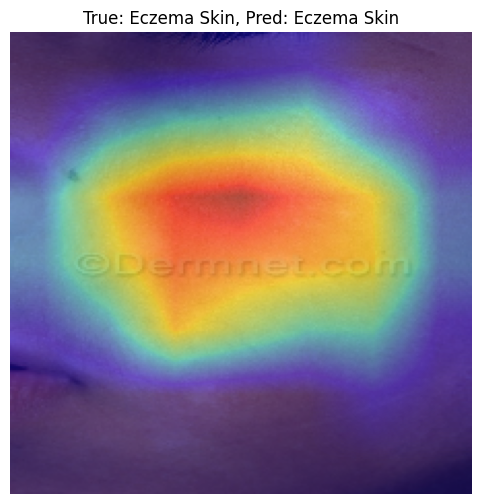

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


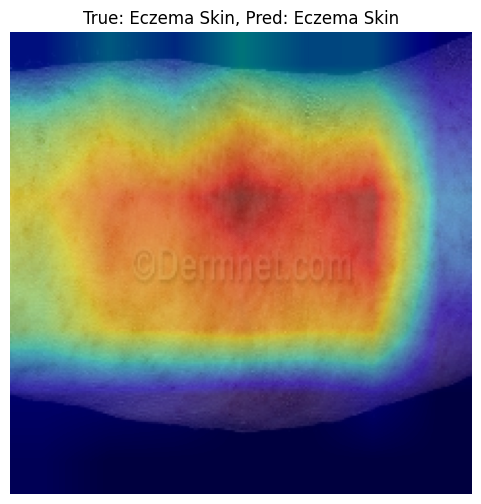

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


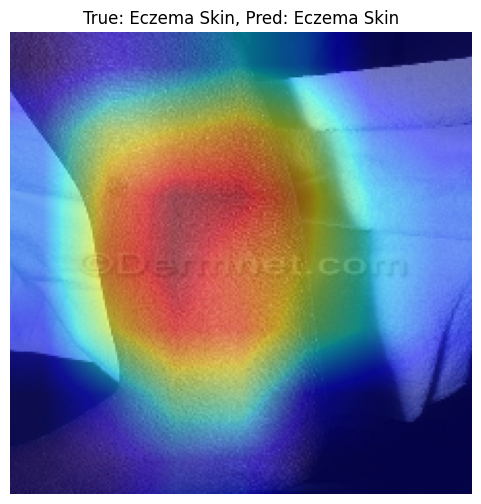

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


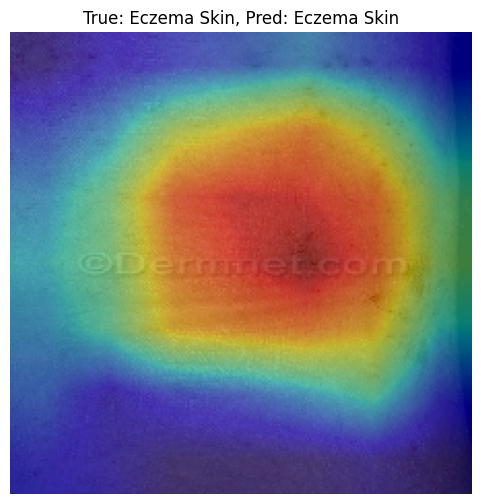

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


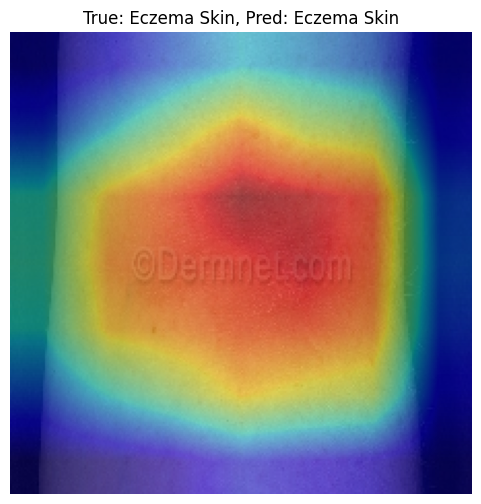

In [ ]:
# Display Grad-CAM for eczema images
layer_name = 'Conv_1'  # Final convolutional layer
num_images = 5  # Number of eczema images to display

# Iterate through the validation dataset and display Grad-CAM for eczema images
count = 0
for i in range(len(X_val)):
    if y_val[i] == 1:  # Check if the image belongs to the 'Eczema Skin' class
        cam = grad_cam(model, X_val[i], layer_name)
        plt.figure(figsize=(6, 6))
        plt.imshow(X_val[i])
        plt.imshow(cam, cmap='jet', alpha=0.5)
        pred_label = categories[np.argmax(model.predict(X_val[i][np.newaxis, ...]))]
        plt.title(f"True: Eczema Skin, Pred: {pred_label}")
        plt.axis('off')
        plt.show()
        count += 1
    if count >= num_images:  # Stop after displaying the specified number of images
        break